# ConGAN(Continuous GAN)



In [1]:
#check the environemnt 

print("Check H/W")
!echo "CPU " &&  lscpu | grep 'CPU(s):            '
!lscpu | grep GHz
! echo "memory" && free -m | cut -c-49 |  head -n 2 

! echo "storage" && df -h |  cut -c-60 | head -n 2
!df -h |  grep '/dev/sda1'

print("confure GPU")
! echo "GPU   " && nvidia-smi -L | cut -c-17
!nvidia-smi -ac 2505,875
!nvidia-smi -pm 1

print("\nCheck S/W")
!cat /etc/*-release | grep PRETTY_NAME
import sys
print("Python Version : ", sys.version)
print("Python result : 3+5=",3+5)
print("installed NVIDIA libraries")
!ls /usr/lib64-nvidia

import tensorflow as tf
import keras as K
print("tensorflow", tf.__version__)
print("keras", K.__version__)

Check H/W
CPU 
CPU(s):              2
Model name:          Intel(R) Xeon(R) CPU @ 2.20GHz
memory
              total        used        free      
Mem:          13022         406       11079      
storage
Filesystem      Size  Used Avail Use% Mounted on
overlay         359G  8.2G  332G   3% /
/dev/sda1       365G   11G  355G   3% /opt/bin
confure GPU
GPU   
GPU 0: Tesla K80 
Applications clocks set to "(MEM 2505, SM 875)" for GPU 00000000:00:04.0


All done.
Enabled persistence mode for GPU 00000000:00:04.0.
All done.

Check S/W
PRETTY_NAME="Ubuntu 18.04.1 LTS"
Python Version :  3.6.6 (default, Sep 12 2018, 18:26:19) 
[GCC 8.0.1 20180414 (experimental) [trunk revision 259383]]
Python result : 3+5= 8
installed NVIDIA libraries
libcuda.so		       libnvidia-egl-wayland.so.1
libcuda.so.1		       libnvidia-egl-wayland.so.1.0.3
libcuda.so.396.44	       libnvidia-encode.so
libEGL_nvidia.so.0	       libnvidia-encode.so.1
libEGL_nvidia.so.396.44        libnvidia-encode.so.396.44
libEGL.so		    

Using TensorFlow backend.


In [0]:
#tensorflow configuration
'''
this is critical option. TF memory control allow_growth is mandatory option
'''
import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config )

In [3]:
!nvidia-smi   | grep MiB

| N/A   34C    P0    80W / 149W |    116MiB / 11441MiB |      0%      Default |


In [0]:
from keras.layers import Input, Dense
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.utils import plot_model
from PIL import Image, ImageDraw, ImageFont

import matplotlib.pyplot as plt
import keras
import math
import os

import numpy as np

In [0]:
EXAMPLES = 100
LATENT_SPACE = 20
INPUT_SPACE = 48
CHANNELS = 3

INPUT_IMG_SIZE = 200
OUTPUT_IMG_SIZE = 64

DATASET_FILE = 'faces.png'


POSITION_INPUTS = 2
position_input = Input(shape = (POSITION_INPUTS,))
img_ident_input = Input(shape = (EXAMPLES,)) 
latent_input = Input(shape = (LATENT_SPACE,))

In [6]:
%%time
!wget https://github.com/Mylittlerapture/ConGAN/raw/master/faces.png
!ls -alh faces.png    

--2018-10-25 08:44:14--  https://github.com/Mylittlerapture/ConGAN/raw/master/faces.png
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Mylittlerapture/ConGAN/master/faces.png [following]
--2018-10-25 08:44:15--  https://raw.githubusercontent.com/Mylittlerapture/ConGAN/master/faces.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10412107 (9.9M) [application/octet-stream]
Saving to: ‘faces.png’

faces.png           100%[===================>]   9.93M  --.-KB/s    in 0.1s    

2018-10-25 08:44:16 (70.6 MB/s) - ‘faces.png’ saved [10412107/10412107]

-rw-r--r-- 1 root root 10M Oct 

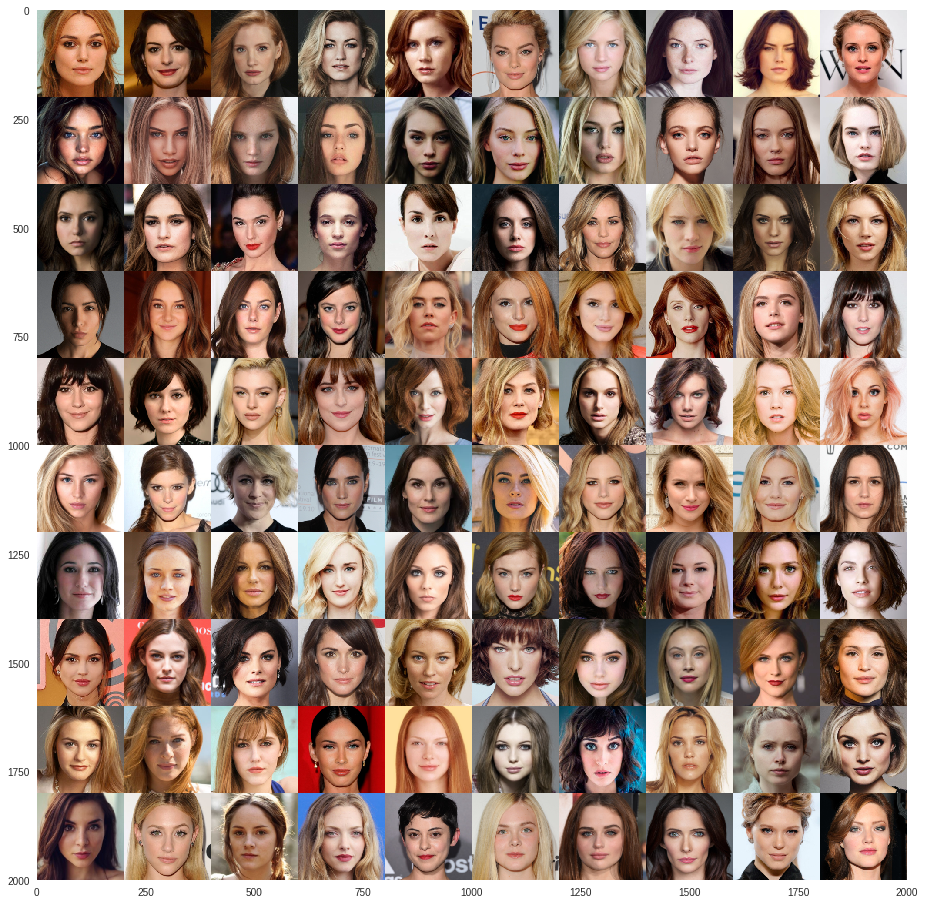

In [7]:
import os
import time
import skimage.io
import matplotlib
import matplotlib.pyplot as plt

IMAGE_DIR='/content/'
image = skimage.io.imread(os.path.join(IMAGE_DIR, DATASET_FILE)) 

plt.figure(figsize=(16,16))
plt.grid(False)
plt.imshow(image)
plt.show()
 

In [0]:

class ConGAN():
    def __init__(self):
        optimizer = Adam(0.0004, 0.5, clipnorm = 1)
        opt_small = Adam(0.0002, 0.5, clipnorm = 1) 
        
        inputs_real = [position_input, img_ident_input]
        inputs_fake = [position_input, latent_input]

        #main pieces
        if (not os.path.isfile('generator.h5')):
            img_ident_layer = Dense(LATENT_SPACE, activation='tanh')(img_ident_input) 
            self.ident = Model(img_ident_input, img_ident_layer, name = 'IDENT')
            #plot_model(self.ident, to_file='ident.png', show_shapes=True)
            
            self.generator = self.build_generator()
            #plot_model(self.generator, to_file='generator.png', show_shapes=True)
            
            self.discriminator = self.build_discriminator()
            #plot_model(self.discriminator, to_file='discriminator.png', show_shapes=True)
        else:
            self.discriminator = load_model('discriminator.h5')
            self.generator = load_model('generator.h5')
            self.ident = load_model('ident.h5')
        
        
        
        self.ident.trainable = True
        self.generator.trainable = True
        self.generator.compile(loss='mse', optimizer=optimizer)
        self.discriminator.trainable = False
        
        self.generator_real_t = self.generator([position_input, self.ident([img_ident_input])])[0] #Train ident -> pixel as normal model
        self.generator_real = Model(inputs_real, self.generator_real_t, name = 'generator_real')
        self.generator_real.compile(loss='mse', optimizer=optimizer)
        #plot_model(self.generator_real, to_file='generator_real.png', show_shapes=True)

        self.generator_fake_t = self.discriminator(self.generator(inputs_fake)[1])   #Train noise -> 1 on discriminator
        self.generator_fake = Model(inputs_fake, self.generator_fake_t, name = 'generator_fake')
        self.generator_fake.compile(loss='binary_crossentropy', optimizer=opt_small)
        #plot_model(self.generator_fake, to_file='generator_fake.png', show_shapes=True)
        
        
        
        
        self.ident.trainable = False
        self.generator.trainable = False
        self.discriminator.trainable = True

        self.discriminator_real_t = self.discriminator(self.generator([position_input, self.ident([img_ident_input])])[1])   #Train discriminator assign ident -> 1
        self.discriminator_real = Model(inputs_real, self.discriminator_real_t, name = 'discriminator_real')
        self.discriminator_real.compile(loss='binary_crossentropy', optimizer=opt_small)
        #plot_model(self.discriminator_real, to_file='discriminator_real.png', show_shapes=True)

        
        self.discriminator_fake_t = self.discriminator(self.generator(inputs_fake)[1])   #Train discriminator assign noise -> 0
        self.discriminator_fake = Model(inputs_fake, self.discriminator_fake_t, name = 'discriminator_fake')
        self.discriminator_fake.compile(loss='binary_crossentropy', optimizer=opt_small)
        #plot_model(self.discriminator_fake, to_file='discriminator_fake.png', show_shapes=True)
        

    # Do not use Batch Normalization anywhere, it will be harmful for discriminator ability 
    # to distinguish good and bad samples, and as a result it will break the generator
    
    def build_generator(self):
        position_layer = Dense(INPUT_SPACE)(position_input) 
        position_layer = LeakyReLU(alpha=0.2)(position_layer) 
        
        #Head layer contains understanding of object we want to create
        head_layer = keras.layers.concatenate([position_layer, latent_input])
        
        head_layer = Dense(256)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        head_layer = Dense(512)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        
        head_layer = Dense(1024)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        head_layer = Dense(1024)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        head_layer = Dense(1024)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        head_layer = Dense(1024)(head_layer) 
        head_layer = LeakyReLU(alpha=0.2)(head_layer) 
        
        
        #Draw part predict color in concrete spot
        draw_layer = head_layer
        draw_layer = Dense(256)(draw_layer)
        draw_layer = LeakyReLU(alpha=0.2)(draw_layer)
        draw_layer = Dense(32)(draw_layer)
        draw_layer = LeakyReLU(alpha=0.2)(draw_layer)
        
        draw_layer = Dense(CHANNELS, activation= 'linear')(draw_layer)

        layer_cnc = keras.layers.concatenate([head_layer, position_layer, draw_layer]) 
        return Model([position_input, latent_input], [draw_layer, layer_cnc], name = 'GENERATOR')
        
    def build_discriminator(self):
        input = Input(shape = (1075,))
        
        layer = input
        layer = Dense(512)(layer) 
        layer = LeakyReLU(alpha=0.2)(layer)
        layer = Dense(128)(layer) 
        layer = LeakyReLU(alpha=0.2)(layer)
        layer = Dense(32)(layer) 
        layer = LeakyReLU(alpha=0.2)(layer)
        layer = Dense(8)(layer) 
        layer = LeakyReLU(alpha=0.2)(layer)
        layer = Dense(1, activation='sigmoid')(layer) 
        
        return Model(input, layer, name = 'DISCRIMINATOR')

        
    def choose_rnd_data(self, batch_size):
        idx = np.random.randint(0, self.train_chan.shape[0], batch_size)
            
        imgs_grid = self.train_grid[idx] 
        imgs_nois = self.noise_for_true[idx]
        imgs_chan = self.train_chan[idx] 
        
        return imgs_grid, imgs_nois, imgs_chan
    
    def train(self, epochs, batch_size=128, save_interval=50):
        part_batch = int(batch_size / 2)
        
        zeros = np.zeros((batch_size, 1))
        ones = np.ones((batch_size, 1))
        stack = np.vstack((zeros[:part_batch], ones[:part_batch]))
        
        main_loss = 0
        for epoch in range(epochs):
            start = time.perf_counter()
        
            imgs_grid, imgs_nois, imgs_chan = self.choose_rnd_data(batch_size)
            g_loss_real=self.generator_real.train_on_batch([imgs_grid, imgs_nois], imgs_chan)
            main_loss += g_loss_real
           
            imgs_grid, imgs_nois, imgs_chan = self.choose_rnd_data(batch_size)
            imgs_nois_rnd = np.random.normal(0,1,(batch_size, LATENT_SPACE))
            imgs_nois_rnd[part_batch:] = self.ident.predict(imgs_nois[part_batch:])
            
            d_loss_fake=self.discriminator_fake.train_on_batch([imgs_grid, imgs_nois_rnd], stack)
            
            
            imgs_grid, imgs_nois, imgs_chan = self.choose_rnd_data(batch_size)
            imgs_nois_rnd = np.random.normal(0,1,(batch_size, LATENT_SPACE))
            g_loss_fake=self.generator_fake.train_on_batch([imgs_grid, imgs_nois_rnd], ones)
            duration = time.perf_counter() - start
            
            if epoch  == 0:
                print("epoch    {} - g_loss_r {:.6f} d_loss_f {:.6f} g_loss_f {:.6f} {:.2f} s/it  -- slow in warm up".format(
                    epoch, g_loss_real, d_loss_fake, g_loss_fake, duration))
            
            if epoch  == 1:
                print("epoch    {} - g_loss_r {:.6f} d_loss_f {:.6f} g_loss_f {:.6f} {:.2f} s/it ".format(
                    epoch, g_loss_real, d_loss_fake, g_loss_fake, duration))
            
            if epoch % 100 == 99:
                print("epoch    {} - main : {:.6f} g_loss_r {:.6f} d_loss_f {:.6f} g_loss_f {:.6f} {:.2f} s/it ".format(
                    epoch, main_loss / 100. , g_loss_real, d_loss_fake, g_loss_fake, duration))
                #print (epoch + 1, main_loss / 50.)
                main_loss = 0
            
            if epoch % save_interval == save_interval - 1:
                self.save_imgs(epoch + 1)
                self.save_models(epoch + 1)

                
    def save_models(self, epoch):
        path = 'saved_model/'+str(epoch)
        self.ident.save(path+'_ident.h5')
        self.generator.save(path+'_generator.h5')
        self.discriminator.save(path+'_discriminator.h5')
        
    def create_grid(self, half_size):
        X,Y = np.mgrid[-half_size:half_size,-half_size:half_size] + 0.5
        grid = np.vstack((X.flatten(), Y.flatten())).T / half_size
        
        # This part of code is highly unnecessary, but might be helpful if you have some 
        # kind of rotation diversity in your data
        
        '''
        #adding ability to construct rotation dependency
        ref_points = np.array([[-1,-1], [1, 1], [-1, 1], [1, -1]])
        sz = grid.shape[0]
        add = np.empty((sz, 0))
        for ref in ref_points:
            grid_ = grid - ref
            r = np.linalg.norm(grid_, axis = 1)
            phi = np.arctan2(grid_[:,1], grid_[:,0]) 
            add = np.concatenate((add, r.reshape(sz,1), np.sin(phi).reshape(sz,1), np.cos(phi).reshape(sz,1)), axis = 1) 
        
        grid = np.concatenate((grid, add), axis = 1)
        '''
        return grid
    
    
    def save_imgs(self, epoch):
        tick = time.perf_counter()
        out_size = OUTPUT_IMG_SIZE #Size of single image in output image set
        out_half_size = math.floor(out_size / 2)

        grid = self.create_grid(out_half_size)
        

        im_out = Image.new("RGB", (out_size * 3, out_size * 3))
        fnt = ImageFont.truetype("arial.ttf", 10)
        

        for i in range(9):
            
            if i<3:
                c_noise = np.eye(EXAMPLES)[np.random.choice(EXAMPLES, 1)]
                c_noise = c_noise.reshape(1, EXAMPLES)
                c_noise = np.repeat(c_noise, grid.shape[0], axis=0)
            
                predicted = self.generator_real.predict([grid, c_noise])
                val = self.discriminator_real.predict([grid, c_noise])
            else:
                c_noise = np.random.normal(0,1,(LATENT_SPACE))
                
                c_noise = c_noise.reshape(1, LATENT_SPACE)
                c_noise = np.repeat(c_noise, grid.shape[0], axis=0)
                
                predicted = self.generator.predict([grid, c_noise])[0]
                val = self.discriminator_fake.predict([grid, c_noise])
            
            predicted = np.clip(predicted *  255., 0, 255) 
            predicted = (predicted).astype(np.uint8).reshape(out_size, out_size, CHANNELS) 
            im = Image.fromarray(predicted)
            
            
            val = np.average(val)
            d = ImageDraw.Draw(im)
            d.text((10,10), "{:.2f}".format(val) , font=fnt, fill=(255,255,255,255))  
            d.text((11,11), "{:.2f}".format(val) , font=fnt, fill=(0,0,0,255))  
            
            im_out.paste(im, (i % 3 * out_size, math.floor(i / 3) * out_size))
            #print ('Img: ', i + 1)
            
        im_out.save("images/out_%7d.png" % epoch)
        tock = time.perf_counter() - tick
        print("         9EA generated image W:{}xH:{}x3ch was saved for epoch {} during {:.2f} sec  ".format( 
                     out_size,out_size,  epoch, tock))
        

    def prepare_data(self, image_container, size = 200):	
        half_size = math.floor(size / 2)
        
        im_arr = np.zeros((EXAMPLES, size, size, CHANNELS))
        im_set = Image.open(image_container).convert('RGB')
        print ('size: ', im_set.size)
        im_set = im_set.resize(np.array(im_set.size))
        wh = (im_set.size[0] / size, im_set.size[1] / size)
        
        for i in range(EXAMPLES):
            w = i % wh[0] * size
            h = math.floor (i / wh[0]) * size
            im = im_set.crop((w, h, w + size, h + size))	
            im_arr[i] = np.array(im).reshape(size, size, CHANNELS) / 255.

        im_arr = im_arr.reshape(EXAMPLES * size * size, CHANNELS)
        print ('im_arr shape:', im_arr.shape)	

        grid = self.create_grid(half_size)
        print ('grid shape:', grid.shape)	
        
        grid_ = grid.reshape(1, (half_size * 2) ** 2, POSITION_INPUTS)
        grid_ = np.repeat(grid_, EXAMPLES, axis=0).reshape(EXAMPLES * size * size, POSITION_INPUTS)
        print ('grid_ shape:', grid_.shape)	
        
        lat_arr = np.zeros((EXAMPLES, EXAMPLES))
        pnt = np.arange(EXAMPLES)
        lat_arr[pnt, pnt] = 1 #one hot matrix for representing pictures		
        
        lat_arr = lat_arr.reshape(EXAMPLES, 1, EXAMPLES)
        noise = np.repeat(lat_arr, size * size, axis=1).reshape(EXAMPLES * size * size, EXAMPLES)
        print ('noise shape:', noise.shape)	
        
        self.noise_for_true = noise
        self.train_chan = im_arr
        self.train_grid = grid_


        

In [9]:
!wget https://github.com/JotJunior/PHP-Boleto-ZF2/raw/master/public/assets/fonts/arial.ttf
font_type = ImageFont.truetype("arial.ttf", 18)

--2018-10-25 08:45:00--  https://github.com/JotJunior/PHP-Boleto-ZF2/raw/master/public/assets/fonts/arial.ttf
Resolving github.com (github.com)... 192.30.253.112, 192.30.253.113
Connecting to github.com (github.com)|192.30.253.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JotJunior/PHP-Boleto-ZF2/master/public/assets/fonts/arial.ttf [following]
--2018-10-25 08:45:00--  https://raw.githubusercontent.com/JotJunior/PHP-Boleto-ZF2/master/public/assets/fonts/arial.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 311636 (304K) [application/octet-stream]
Saving to: ‘arial.ttf’

arial.ttf           100%[===================>] 304.33K  --.-KB/s    in 0.05s   

2018-10-25 08:45:01 (5.87 MB/s) - ‘arial

In [0]:
def reset_dir():
    import os
    model_path ='/content/saved_model'
    img_path = '/content/images'

    if not os.path.isdir(model_path):
        os.mkdir(model_path)
    else:
        for filename in os.listdir(model_path):
            os.remove(os.path.join(model_path,filename))

    if not os.path.isdir(img_path):
        os.mkdir(img_path)
    else:
        for filename in os.listdir(img_path):
            os.remove(os.path.join(img_path,filename))
            
def display_img():
    from IPython.display import Image, display
    import os
    flist = os.listdir("/content/images")
    flist.sort()
    for item in  flist:
        print("Epoch :",item)
        display(Image(filename="/content/images/"+item) )
        
def display_img_last():
    from IPython.display import Image, display
    import os
    flist = os.listdir("/content/images")
    item=max(flist)
    print(item)
    IMAGE_DIR='/content/images'
    image = skimage.io.imread(os.path.join(IMAGE_DIR, item)) 

    plt.figure(figsize=(6,6))
    plt.grid(False)
    plt.imshow(image)
    plt.show()      

In [11]:
gan = ConGAN()
reset_dir( )
gan.prepare_data(DATASET_FILE, size = INPUT_IMG_SIZE)


size:  (2000, 2000)
im_arr shape: (4000000, 3)
grid shape: (40000, 2)
grid_ shape: (4000000, 2)
noise shape: (4000000, 100)


In [0]:
%%time
gan.train(epochs=100001, batch_size=256, save_interval=5000)
display_img_last()
display_img()
display_img_last()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:975: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch    0 - g_loss_r 0.297237 d_loss_f 0.697097 g_loss_f 0.716817 6.31 s/it  -- slow in warm up
epoch    1 - g_loss_r 0.234733 d_loss_f 0.709224 g_loss_f 0.698796 0.05 s/it 
epoch    99 - main : 0.082171 g_loss_r 0.046105 d_loss_f 0.689750 g_loss_f 0.685926 0.05 s/it 
epoch    199 - main : 0.048460 g_loss_r 0.044198 d_loss_f 0.694185 g_loss_f 0.690061 0.05 s/it 
epoch    299 - main : 0.037800 g_loss_r 0.032254 d_loss_f 0.689387 g_loss_f 0.689726 0.05 s/it 
epoch    399 - main : 0.035492 g_loss_r 0.047139 d_loss_f 0.693401 g_loss_f 0.699559 0.05 s/it 
epoch    499 - main : 0.032551 g_loss_r 0.030165 d_loss_f 0.693422 g_loss_f 0.693037 0.05 s/it 
epoch    599 - main : 0.030892 g_loss_r 0.024805 d_loss_f 0.690376 g_loss_f 0.714675 0.05 s/it 
epoch    699 - main : 0.030822 g_loss_r 0.027038 d_loss_f 0.687116 g_loss_f 0.718020 0.05 s/it 
epoch    799 - main : 0.030637 g_loss_r 0.026142 d_loss_f 0.685764 g_loss_f 0.728055 0.05 s/it 
epoch    899 - main : 0.030186 g_loss_r 0.023712 d_loss_f 

out_ 100000.png


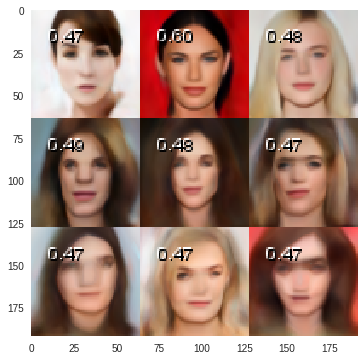

In [18]:
display_img_last()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:975: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch    0 - g_loss_r 0.004041 d_loss_f 0.660732 g_loss_f 0.741972 0.12 s/it  -- slow in warm up
epoch    1 - g_loss_r 0.005824 d_loss_f 0.664778 g_loss_f 0.737413 0.12 s/it 
epoch    99 - main : 0.004599 g_loss_r 0.005023 d_loss_f 0.671578 g_loss_f 0.735475 0.10 s/it 
epoch    199 - main : 0.005181 g_loss_r 0.005785 d_loss_f 0.676608 g_loss_f 0.740505 0.10 s/it 
epoch    299 - main : 0.004976 g_loss_r 0.004310 d_loss_f 0.678641 g_loss_f 0.741341 0.09 s/it 
epoch    399 - main : 0.004814 g_loss_r 0.004229 d_loss_f 0.680849 g_loss_f 0.741229 0.10 s/it 
epoch    499 - main : 0.004936 g_loss_r 0.005149 d_loss_f 0.670880 g_loss_f 0.736196 0.10 s/it 
epoch    599 - main : 0.005255 g_loss_r 0.005370 d_loss_f 0.679532 g_loss_f 0.747417 0.09 s/it 
epoch    699 - main : 0.004928 g_loss_r 0.006357 d_loss_f 0.674334 g_loss_f 0.736534 0.09 s/it 
epoch    799 - main : 0.004752 g_loss_r 0.004669 d_loss_f 0.665460 g_loss_f 0.743387 0.09 s/it 
epoch    899 - main : 0.004800 g_loss_r 0.004705 d_loss_f 

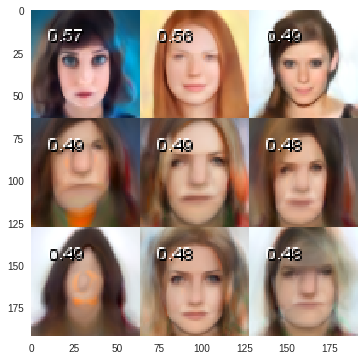

Epoch : out_   1000.png


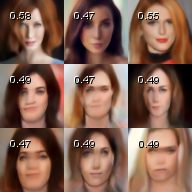

Epoch : out_   2000.png


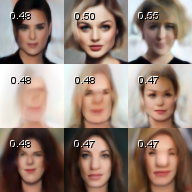

Epoch : out_   3000.png


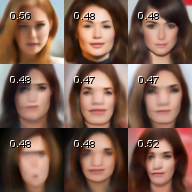

Epoch : out_   4000.png


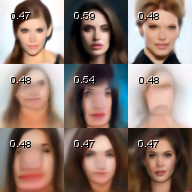

Epoch : out_   5000.png


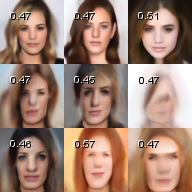

Epoch : out_   6000.png


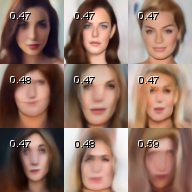

Epoch : out_   7000.png


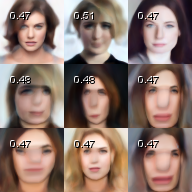

Epoch : out_   8000.png


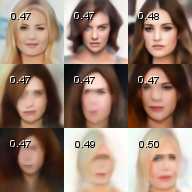

Epoch : out_   9000.png


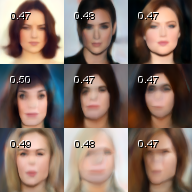

Epoch : out_  10000.png


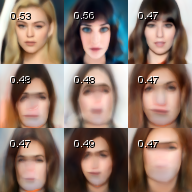

Epoch : out_  11000.png


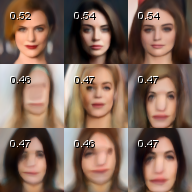

Epoch : out_  12000.png


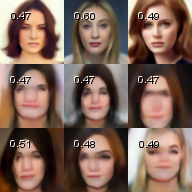

Epoch : out_  13000.png


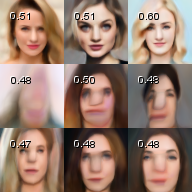

Epoch : out_  14000.png


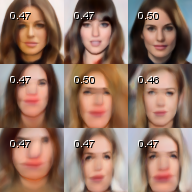

Epoch : out_  15000.png


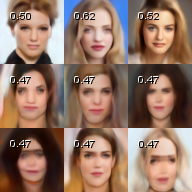

Epoch : out_  16000.png


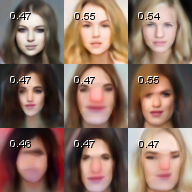

Epoch : out_  17000.png


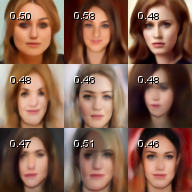

Epoch : out_  18000.png


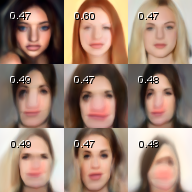

Epoch : out_  19000.png


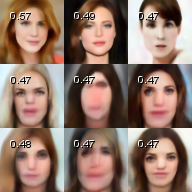

Epoch : out_  20000.png


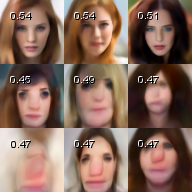

Epoch : out_  21000.png


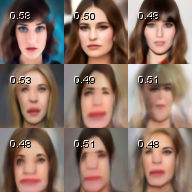

Epoch : out_  22000.png


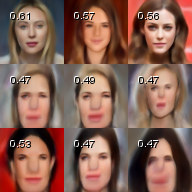

Epoch : out_  23000.png


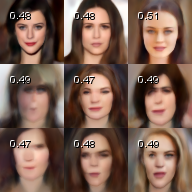

Epoch : out_  24000.png


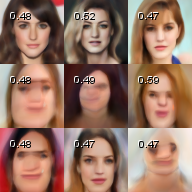

Epoch : out_  25000.png


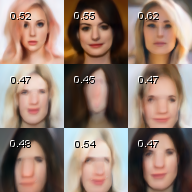

Epoch : out_  26000.png


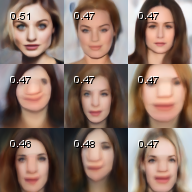

Epoch : out_  27000.png


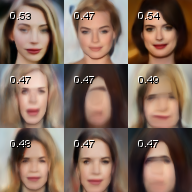

Epoch : out_  28000.png


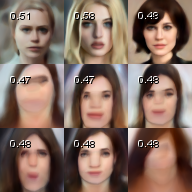

Epoch : out_  29000.png


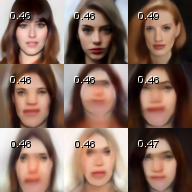

Epoch : out_  30000.png


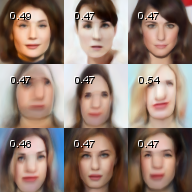

Epoch : out_  31000.png


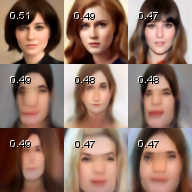

Epoch : out_  32000.png


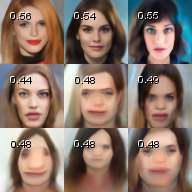

Epoch : out_  33000.png


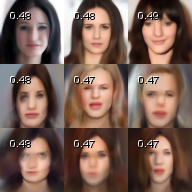

Epoch : out_  34000.png


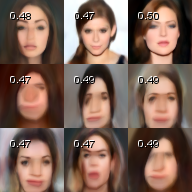

Epoch : out_  35000.png


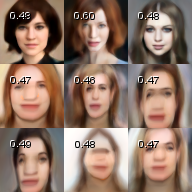

Epoch : out_  36000.png


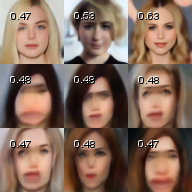

Epoch : out_  37000.png


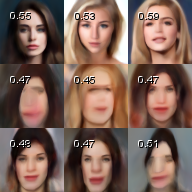

Epoch : out_  38000.png


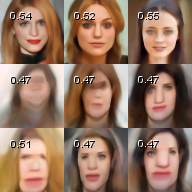

Epoch : out_  39000.png


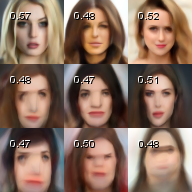

Epoch : out_  40000.png


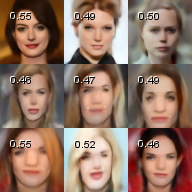

Epoch : out_  41000.png


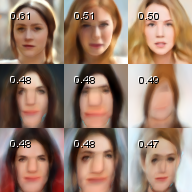

Epoch : out_  42000.png


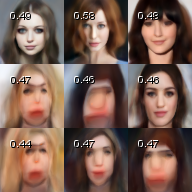

Epoch : out_  43000.png


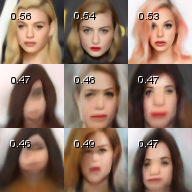

Epoch : out_  44000.png


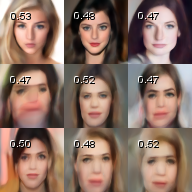

Epoch : out_  45000.png


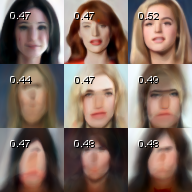

Epoch : out_  46000.png


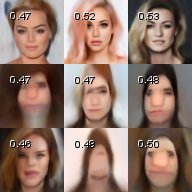

Epoch : out_  47000.png


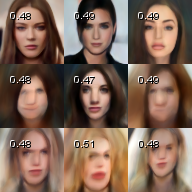

Epoch : out_  48000.png


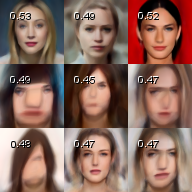

Epoch : out_  49000.png


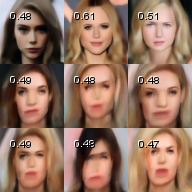

Epoch : out_  50000.png


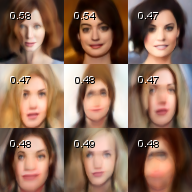

Epoch : out_  51000.png


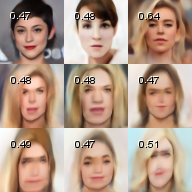

Epoch : out_  52000.png


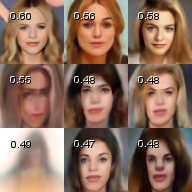

Epoch : out_  53000.png


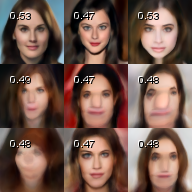

Epoch : out_  54000.png


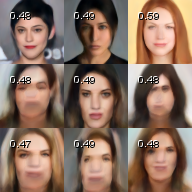

Epoch : out_  55000.png


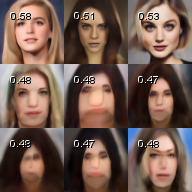

Epoch : out_  56000.png


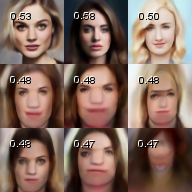

Epoch : out_  57000.png


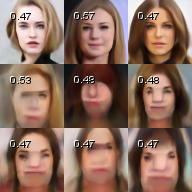

Epoch : out_  58000.png


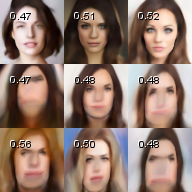

Epoch : out_  59000.png


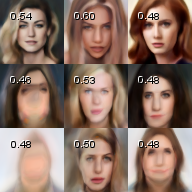

Epoch : out_  60000.png


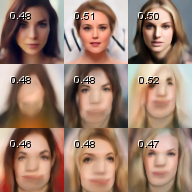

Epoch : out_  61000.png


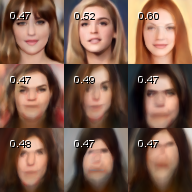

Epoch : out_  62000.png


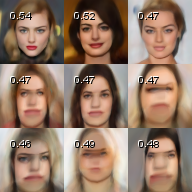

Epoch : out_  63000.png


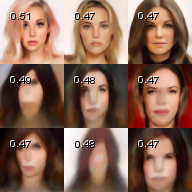

Epoch : out_  64000.png


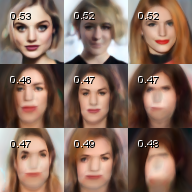

Epoch : out_  65000.png


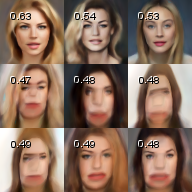

Epoch : out_  66000.png


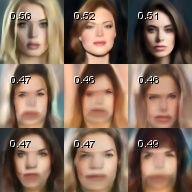

Epoch : out_  67000.png


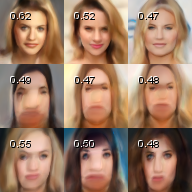

Epoch : out_  68000.png


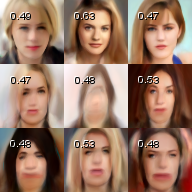

Epoch : out_  69000.png


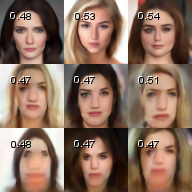

Epoch : out_  70000.png


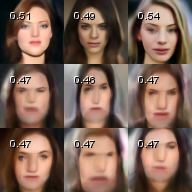

Epoch : out_  71000.png


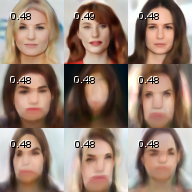

Epoch : out_  72000.png


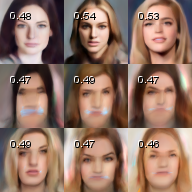

Epoch : out_  73000.png


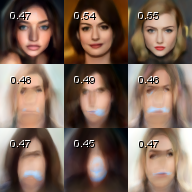

Epoch : out_  74000.png


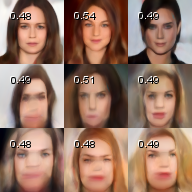

Epoch : out_  75000.png


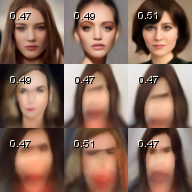

Epoch : out_  76000.png


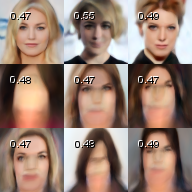

Epoch : out_  77000.png


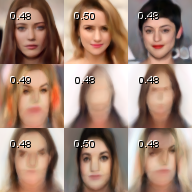

Epoch : out_  78000.png


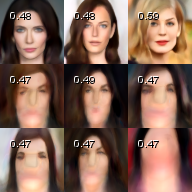

Epoch : out_  79000.png


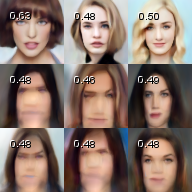

Epoch : out_  80000.png


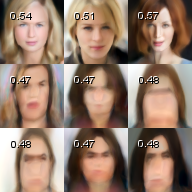

Epoch : out_  81000.png


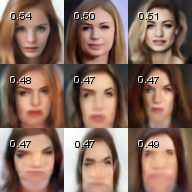

Epoch : out_  82000.png


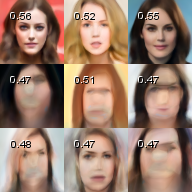

Epoch : out_  83000.png


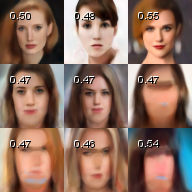

Epoch : out_  84000.png


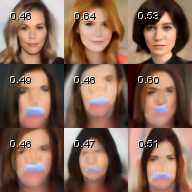

Epoch : out_  85000.png


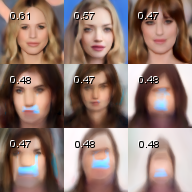

Epoch : out_  86000.png


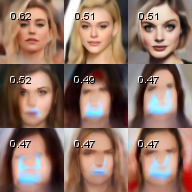

Epoch : out_  87000.png


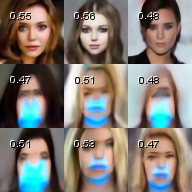

Epoch : out_  88000.png


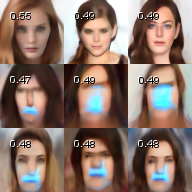

Epoch : out_  89000.png


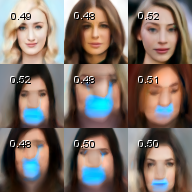

Epoch : out_  90000.png


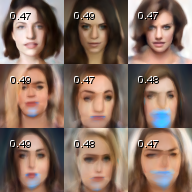

Epoch : out_  91000.png


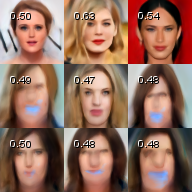

Epoch : out_  92000.png


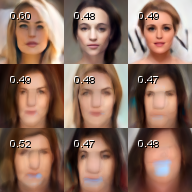

Epoch : out_  93000.png


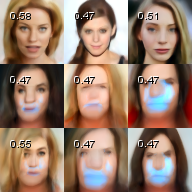

Epoch : out_  94000.png


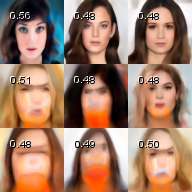

Epoch : out_  95000.png


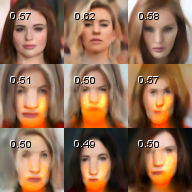

Epoch : out_  96000.png


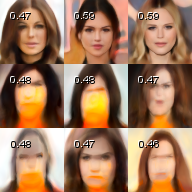

Epoch : out_  97000.png


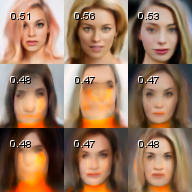

Epoch : out_  98000.png


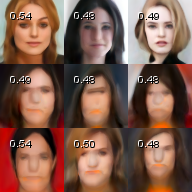

Epoch : out_  99000.png


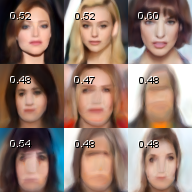

Epoch : out_ 100000.png


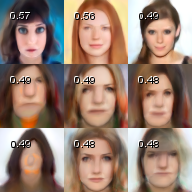

out_ 100000.png


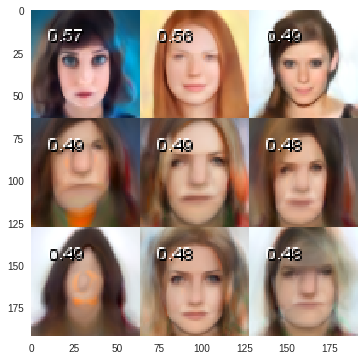

CPU times: user 2h 29min 57s, sys: 23min 34s, total: 2h 53min 31s
Wall time: 2h 50min 22s


In [20]:
%%time
gan.train(epochs=100001, batch_size=1024, save_interval=1000)
display_img_last()
display_img()
display_img_last()

In [0]:
reset_dir( )